In [1]:
import tensorflow as tf

import os
import math
import numpy as np

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing import image_dataset_from_directory

from IPython.display import display

In [2]:
!wget http://www.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz

--2020-10-01 19:39:09--  http://www.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz
Resolving www.eecs.berkeley.edu (www.eecs.berkeley.edu)... 23.185.0.1, 2620:12a:8000::1, 2620:12a:8001::1
Connecting to www.eecs.berkeley.edu (www.eecs.berkeley.edu)|23.185.0.1|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://www.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz [following]
--2020-10-01 19:39:09--  https://www.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz
Connecting to www.eecs.berkeley.edu (www.eecs.berkeley.edu)|23.185.0.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz [following]
--2020-10-01 19:39:10--  https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz
Resolving www2.eecs.berkeley.edu (ww

In [3]:
!ls

BSR_bsds500.tgz  sample_data


In [4]:
!tar -zxvf BSR_bsds500.tgz

BSR/
BSR/documentation/
BSR/documentation/Arbelaez_Maire_Fowlkes_Malik_TPAMI2010.pdf
BSR/bench/
BSR/bench/source/
BSR/bench/source/match.hh
BSR/bench/source/Matrix.cc
BSR/bench/source/Timer.cc
BSR/bench/source/csa_types.h
BSR/bench/source/csa.cc
BSR/bench/source/correspondPixels.cc
BSR/bench/source/build.sh
BSR/bench/source/match.cc
BSR/bench/source/Sort.hh
BSR/bench/source/csa_defs.h
BSR/bench/source/Timer.hh
BSR/bench/source/Exception.cc
BSR/bench/source/String.cc
BSR/bench/source/Array.hh
BSR/bench/source/kofn.hh
BSR/bench/source/Random.hh
BSR/bench/source/Exception.hh
BSR/bench/source/.gitignore
BSR/bench/source/kofn.cc
BSR/bench/source/build.m
BSR/bench/source/Random.cc
BSR/bench/source/Point.hh
BSR/bench/source/README
BSR/bench/source/Matrix.hh
BSR/bench/source/csa.hh
BSR/bench/source/String.hh
BSR/bench/bench_bsds500.m
BSR/bench/data/
BSR/bench/data/groundTruth/
BSR/bench/data/groundTruth/6046.mat
BSR/bench/data/groundTruth/2018.mat
BSR/bench/data/groundTruth/8068.mat
BSR/bench/

In [5]:
!ls

BSR  BSR_bsds500.tgz  sample_data


In [6]:
cd BSR/BSDS500/data/images/test

/content/BSR/BSDS500/data/images/test


In [7]:
!ls

100007.jpg  134049.jpg	183066.jpg  228076.jpg	306051.jpg  45000.jpg
100039.jpg  134067.jpg	185092.jpg  230063.jpg	306052.jpg  48017.jpg
100099.jpg  140006.jpg	187058.jpg  230098.jpg	3063.jpg    48025.jpg
10081.jpg   140088.jpg	187099.jpg  23050.jpg	309040.jpg  49024.jpg
101027.jpg  14085.jpg	188025.jpg  232076.jpg	317043.jpg  5096.jpg
101084.jpg  14092.jpg	189006.jpg  235098.jpg	326025.jpg  51084.jpg
102062.jpg  141012.jpg	189013.jpg  238025.jpg	326085.jpg  6046.jpg
103006.jpg  141048.jpg	189029.jpg  243095.jpg	33044.jpg   61034.jpg
103029.jpg  145059.jpg	189096.jpg  246009.jpg	334025.jpg  64061.jpg
103078.jpg  145079.jpg	196027.jpg  247003.jpg	335088.jpg  65084.jpg
104010.jpg  146074.jpg	196040.jpg  247012.jpg	335094.jpg  69000.jpg
104055.jpg  147077.jpg	196062.jpg  249021.jpg	344010.jpg  69007.jpg
105027.jpg  147080.jpg	196088.jpg  250047.jpg	346016.jpg  69022.jpg
106005.jpg  15011.jpg	198087.jpg  250087.jpg	347031.jpg  70011.jpg
106047.jpg  15062.jpg	20069.jpg   253016.jpg	35028.jpg

In [8]:
!git clone https://github.com/niazwazir/SET5_BMP.git

Cloning into 'SET5_BMP'...
remote: Enumerating objects: 7, done.
remote: Counting objects: 100% (7/7), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 14 (delta 1), reused 0 (delta 0), pack-reused 7
Unpacking objects: 100% (14/14), done.


In [9]:
cd ..

/content/BSR/BSDS500/data/images


In [10]:
cd ..

/content/BSR/BSDS500/data


In [11]:
cd ..

/content/BSR/BSDS500


In [12]:
cd ..

/content/BSR


In [13]:
cd ..

/content


In [14]:
!ls

BSR  BSR_bsds500.tgz  sample_data


## Load data: BSDS500 dataset

### Download dataset

We use the built-in `keras.utils.get_file` utility to retrieve the dataset.

In [15]:
root_dir = ("BSR/BSDS500/data")

In [16]:
#dataset_url = "http://www.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz"
#data_dir = keras.utils.get_file(origin=dataset_url, fname="BSR", untar=True)
#root_dir = os.path.join(data_dir, "BSDS500/data")

We create training and validation datasets via `image_dataset_from_directory`.

In [17]:
crop_size = 200
upscale_factor = 2
input_size = crop_size // upscale_factor
batch_size = 8

train_ds = image_dataset_from_directory(
    root_dir,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="training",
    seed=1337,
    label_mode=None,
)

valid_ds = image_dataset_from_directory(
    root_dir,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="validation",
    seed=1337,
    label_mode=None,
)

Found 508 files belonging to 2 classes.
Using 407 files for training.
Found 508 files belonging to 2 classes.
Using 101 files for validation.


We rescale the images to take values in the range [0, 1].

In [18]:
!ls

BSR  BSR_bsds500.tgz  sample_data


In [19]:
def scaling(input_image):
    input_image = input_image / 255.0
    return input_image


# Scale from (0, 255) to (0, 1)
train_ds = train_ds.map(scaling)
valid_ds = valid_ds.map(scaling)

Let's visualize a few sample images:

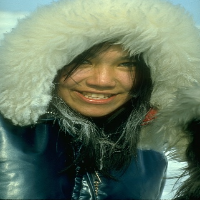

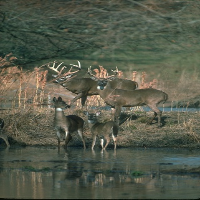

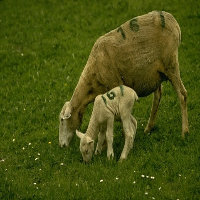

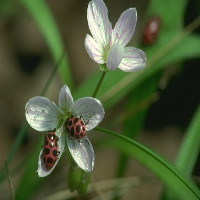

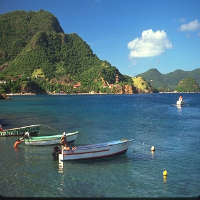

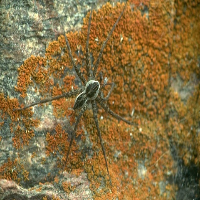

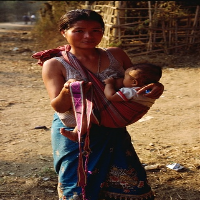

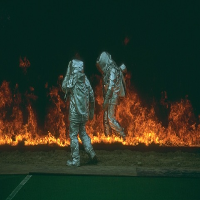

In [20]:
for batch in train_ds.take(1):
    for img in batch:
        display(array_to_img(img))

In [21]:
dataset = os.path.join(root_dir, "images")
test_path = os.path.join(dataset, "test/SET5_BMP")

test_img_paths = sorted(
    [
        os.path.join(test_path, fname)
        for fname in os.listdir(test_path)
        if fname.endswith(".bmp")
    ]
)

We prepare a dataset of test image paths that we will use for
visual evaluation at the end of this example.

## Crop and resize images

Let's process image data.
First, we convert our images from the RGB color space to the
[YUV colour space](https://en.wikipedia.org/wiki/YUV).

For the input data (low-resolution images),
we crop the image, retrieve the `y` channel (luninance),
and resize it with the `area` method (use `BICUBIC` if you use PIL).
We only consider the luminance channel
in the YUV color space because humans are more sensitive to
luminance change.

For the target data (high-resolution images), we just crop the image
and retrieve the `y` channel.

In [22]:

# Use TF Ops to process.
def process_input(input, input_size, upscale_factor):
    input = tf.image.rgb_to_yuv(input)
    last_dimension_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis=last_dimension_axis)
    return tf.image.resize(y, [input_size, input_size], method="area")


def process_target(input):
    input = tf.image.rgb_to_yuv(input)
    last_dimension_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis=last_dimension_axis)
    return y


train_ds = train_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
train_ds = train_ds.prefetch(buffer_size=32)

valid_ds = valid_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
valid_ds = valid_ds.prefetch(buffer_size=32)

Let's take a look at the input and target data.

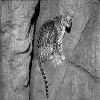

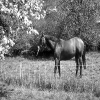

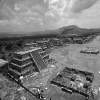

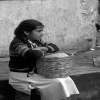

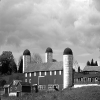

...

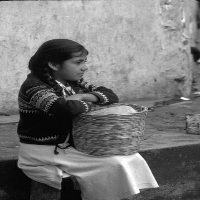

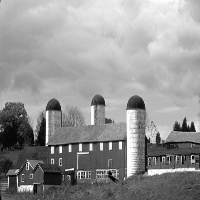

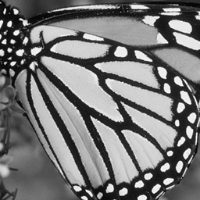

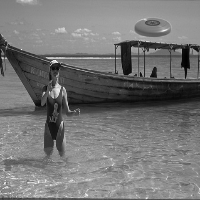

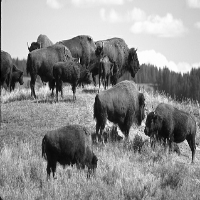

In [23]:
for batch in train_ds.take(1):
    for img in batch[0]:
        display(array_to_img(img))
    for img in batch[1]:
        display(array_to_img(img))

## Build a model

Compared to the paper, we add one more layer and we use the `relu` activation function
instead of `tanh`.
It achieves better performance even though we train the model for fewer epochs.

In [24]:

def get_model(upscale_factor=3, channels=1):
    conv_args = {
        "activation": "relu",
        "kernel_initializer": "Orthogonal",
        "padding": "same",
    }
    inputs = keras.Input(shape=(None, None, channels))
    x = layers.Conv2D(64, 5, **conv_args)(inputs)
    x = layers.Conv2D(64, 3, **conv_args)(x)
    x = layers.Conv2D(32, 3, **conv_args)(x)
    x = layers.Conv2D(channels * (upscale_factor ** 2), 3, **conv_args)(x)
    outputs = tf.nn.depth_to_space(x, upscale_factor)

    return keras.Model(inputs, outputs)


## Define utility functions

We need to define several utility functions to monitor our results:

- `plot_results` to plot an save an image.
- `get_lowres_image` to convert an image to its low-resolution version.
- `upscale_image` to turn a low-resolution image to
a high-resolution version reconstructed by the model.
In this function, we use the `y` channel from the YUV color space
as input to the model and then combine the output with the
other channels to obtain an RGB image.

In [25]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import PIL


def plot_results(img, prefix, title):
    """Plot the result with zoom-in area."""
    img_array = img_to_array(img)
    img_array = img_array.astype("float32") / 255.0

    # Create a new figure with a default 111 subplot.
    fig, ax = plt.subplots()
    im = ax.imshow(img_array[::-1], origin="lower")

    plt.title(title)
    # zoom-factor: 2.0, location: upper-left
    axins = zoomed_inset_axes(ax, 2, loc=2)
    axins.imshow(img_array[::-1], origin="lower")

    # Specify the limits.
    x1, x2, y1, y2 = 200, 300, 100, 200
    # Apply the x-limits.
    axins.set_xlim(x1, x2)
    # Apply the y-limits.
    axins.set_ylim(y1, y2)

    plt.yticks(visible=False)
    plt.xticks(visible=False)

    # Make the line.
    mark_inset(ax, axins, loc1=1, loc2=3, fc="none", ec="blue")
    plt.savefig(str(prefix) + "-" + title + ".png")
    plt.show()


def get_lowres_image(img, upscale_factor):
    """Return low-resolution image to use as model input."""
    return img.resize(
        (img.size[0] // upscale_factor, img.size[1] // upscale_factor),
        PIL.Image.BICUBIC,
    )


def upscale_image(model, img):
    """Predict the result based on input image and restore the image as RGB."""
    ycbcr = img.convert("YCbCr")
    y, cb, cr = ycbcr.split()
    y = img_to_array(y)
    y = y.astype("float32") / 255.0

    input = np.expand_dims(y, axis=0)
    out = model.predict(input)

    out_img_y = out[0]
    out_img_y *= 255.0

    # Restore the image in RGB color space.
    out_img_y = out_img_y.clip(0, 255)
    out_img_y = out_img_y.reshape((np.shape(out_img_y)[0], np.shape(out_img_y)[1]))
    out_img_y = PIL.Image.fromarray(np.uint8(out_img_y), mode="L")
    out_img_cb = cb.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img_cr = cr.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img = PIL.Image.merge("YCbCr", (out_img_y, out_img_cb, out_img_cr)).convert(
        "RGB"
    )
    return out_img


## Define callbacks to monitor training

The `ESPCNCallback` object will compute and display
the [PSNR](https://en.wikipedia.org/wiki/Peak_signal-to-noise_ratio) metric.
This is the main metric we use to evaluate super-resolution performance.

In [26]:

class ESPCNCallback(keras.callbacks.Callback):
    def __init__(self):
        super(ESPCNCallback, self).__init__()
        self.test_img = get_lowres_image(load_img(test_img_paths[0]), upscale_factor)

    # Store PSNR value in each epoch.
    def on_epoch_begin(self, epoch, logs=None):
        self.psnr = []

    def on_epoch_end(self, epoch, logs=None):
        print("Mean PSNR for epoch: %.2f" % (np.mean(self.psnr)))
        if epoch % 20 == 0:
            prediction = upscale_image(self.model, self.test_img)
            plot_results(prediction, "epoch-" + str(epoch), "prediction")

    def on_test_batch_end(self, batch, logs=None):
        self.psnr.append(10 * math.log10(1 / logs["loss"]))


Define `ModelCheckpoint` and `EarlyStopping` callbacks.

In [27]:
early_stopping_callback = keras.callbacks.EarlyStopping(monitor="loss", patience=10)

checkpoint_filepath = "/tmp/checkpoint"

model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor="loss",
    mode="min",
    save_best_only=True,
)

model = get_model(upscale_factor=upscale_factor, channels=1)
model.summary()

callbacks = [ESPCNCallback(), early_stopping_callback, model_checkpoint_callback]
loss_fn = keras.losses.MeanSquaredError()
optimizer = keras.optimizers.Adam(learning_rate=0.001)

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 1)]   0         
_________________________________________________________________
conv2d (Conv2D)              (None, None, None, 64)    1664      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, None, None, 64)    36928     
_________________________________________________________________
conv2d_2 (Conv2D)            (None, None, None, 32)    18464     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, None, None, 4)     1156      
_________________________________________________________________
tf_op_layer_DepthToSpace (Te [(None, None, None, 1)]   0         
Total params: 58,212
Trainable params: 58,212
Non-trainable params: 0
__________________________________________________

## Train the model

Epoch 1/100
Mean PSNR for epoch: 22.92


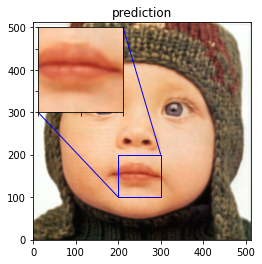

51/51 - 2s - loss: 0.0180 - val_loss: 0.0050
Epoch 2/100
Mean PSNR for epoch: 24.93
51/51 - 2s - loss: 0.0038 - val_loss: 0.0032
Epoch 3/100
Mean PSNR for epoch: 25.12
51/51 - 2s - loss: 0.0030 - val_loss: 0.0029
Epoch 4/100
Mean PSNR for epoch: 25.60
51/51 - 2s - loss: 0.0027 - val_loss: 0.0028
Epoch 5/100
Mean PSNR for epoch: 25.64
51/51 - 1s - loss: 0.0026 - val_loss: 0.0028
Epoch 6/100
Mean PSNR for epoch: 25.73
51/51 - 2s - loss: 0.0026 - val_loss: 0.0028
Epoch 7/100
Mean PSNR for epoch: 25.01
51/51 - 1s - loss: 0.0029 - val_loss: 0.0031
Epoch 8/100
Mean PSNR for epoch: 25.11
51/51 - 1s - loss: 0.0026 - val_loss: 0.0027
Epoch 9/100
Mean PSNR for epoch: 25.81
51/51 - 1s - loss: 0.0025 - val_loss: 0.0027
Epoch 10/100
Mean PSNR for epoch: 25.93
51/51 - 2s - loss: 0.0025 - val_loss: 0.0027
Epoch 11/100
Mean PSNR for epoch: 25.49
51/51 - 2s - loss: 0.0025 - val_loss: 0.0026
Epoch 12/100
Mean PSNR for epoch: 26.15
51/51 - 1s - loss: 0.0025 - val_loss: 0.0026
Epoch 13/100
Mean PSNR for e

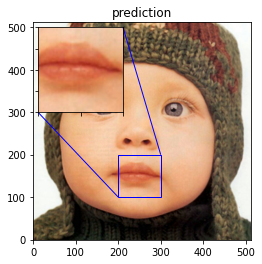

51/51 - 2s - loss: 0.0024 - val_loss: 0.0026
Epoch 22/100
Mean PSNR for epoch: 26.21
51/51 - 2s - loss: 0.0024 - val_loss: 0.0026
Epoch 23/100
Mean PSNR for epoch: 26.55
51/51 - 2s - loss: 0.0024 - val_loss: 0.0025
Epoch 24/100
Mean PSNR for epoch: 26.21
51/51 - 2s - loss: 0.0024 - val_loss: 0.0025
Epoch 25/100
Mean PSNR for epoch: 25.46
51/51 - 2s - loss: 0.0026 - val_loss: 0.0026
Epoch 26/100
Mean PSNR for epoch: 26.10
51/51 - 1s - loss: 0.0024 - val_loss: 0.0025
Epoch 27/100
Mean PSNR for epoch: 26.07
51/51 - 1s - loss: 0.0025 - val_loss: 0.0025
Epoch 28/100
Mean PSNR for epoch: 25.63
51/51 - 2s - loss: 0.0024 - val_loss: 0.0025
Epoch 29/100
Mean PSNR for epoch: 25.81
51/51 - 2s - loss: 0.0024 - val_loss: 0.0025
Epoch 30/100
Mean PSNR for epoch: 26.20
51/51 - 2s - loss: 0.0024 - val_loss: 0.0025
Epoch 31/100
Mean PSNR for epoch: 25.88
51/51 - 2s - loss: 0.0024 - val_loss: 0.0025
Epoch 32/100
Mean PSNR for epoch: 26.01
51/51 - 2s - loss: 0.0024 - val_loss: 0.0025
Epoch 33/100
Mean PS

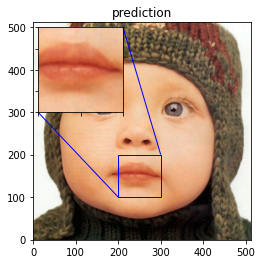

51/51 - 2s - loss: 0.0023 - val_loss: 0.0025
Epoch 42/100
Mean PSNR for epoch: 26.26
51/51 - 1s - loss: 0.0023 - val_loss: 0.0025
Epoch 43/100
Mean PSNR for epoch: 25.92
51/51 - 1s - loss: 0.0023 - val_loss: 0.0025
Epoch 44/100
Mean PSNR for epoch: 26.50
51/51 - 2s - loss: 0.0023 - val_loss: 0.0025
Epoch 45/100
Mean PSNR for epoch: 26.01
51/51 - 2s - loss: 0.0025 - val_loss: 0.0025
Epoch 46/100
Mean PSNR for epoch: 26.26
51/51 - 1s - loss: 0.0025 - val_loss: 0.0025
Epoch 47/100
Mean PSNR for epoch: 26.47
51/51 - 2s - loss: 0.0023 - val_loss: 0.0025
Epoch 48/100
Mean PSNR for epoch: 25.72
51/51 - 1s - loss: 0.0023 - val_loss: 0.0025
Epoch 49/100
Mean PSNR for epoch: 26.64
51/51 - 2s - loss: 0.0023 - val_loss: 0.0025
Epoch 50/100
Mean PSNR for epoch: 25.76
51/51 - 1s - loss: 0.0023 - val_loss: 0.0025
Epoch 51/100
Mean PSNR for epoch: 26.10
51/51 - 2s - loss: 0.0023 - val_loss: 0.0025
Epoch 52/100
Mean PSNR for epoch: 25.45
51/51 - 1s - loss: 0.0024 - val_loss: 0.0025
Epoch 53/100
Mean PS

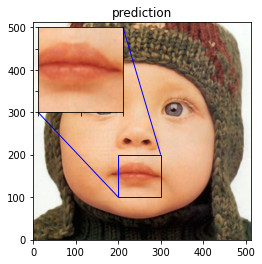

51/51 - 2s - loss: 0.0026 - val_loss: 0.0025
Epoch 62/100
Mean PSNR for epoch: 25.99
51/51 - 2s - loss: 0.0023 - val_loss: 0.0025
Epoch 63/100
Mean PSNR for epoch: 26.18
51/51 - 1s - loss: 0.0023 - val_loss: 0.0025
Epoch 64/100
Mean PSNR for epoch: 26.39
51/51 - 2s - loss: 0.0023 - val_loss: 0.0025
Epoch 65/100
Mean PSNR for epoch: 26.11
51/51 - 2s - loss: 0.0023 - val_loss: 0.0025
Epoch 66/100
Mean PSNR for epoch: 26.16
51/51 - 2s - loss: 0.0023 - val_loss: 0.0024
Epoch 67/100
Mean PSNR for epoch: 26.16
51/51 - 2s - loss: 0.0023 - val_loss: 0.0025
Epoch 68/100
Mean PSNR for epoch: 26.11
51/51 - 2s - loss: 0.0023 - val_loss: 0.0024
Epoch 69/100
Mean PSNR for epoch: 25.89
51/51 - 1s - loss: 0.0023 - val_loss: 0.0025
Epoch 70/100
Mean PSNR for epoch: 26.17
51/51 - 2s - loss: 0.0023 - val_loss: 0.0024
Epoch 71/100
Mean PSNR for epoch: 26.73
51/51 - 2s - loss: 0.0023 - val_loss: 0.0025
Epoch 72/100
Mean PSNR for epoch: 26.19
51/51 - 1s - loss: 0.0023 - val_loss: 0.0025
Epoch 73/100
Mean PS

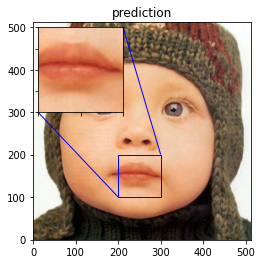

51/51 - 2s - loss: 0.0023 - val_loss: 0.0024
Epoch 82/100
Mean PSNR for epoch: 26.41
51/51 - 2s - loss: 0.0023 - val_loss: 0.0025
Epoch 83/100
Mean PSNR for epoch: 25.75
51/51 - 1s - loss: 0.0023 - val_loss: 0.0024
Epoch 84/100
Mean PSNR for epoch: 26.13
51/51 - 2s - loss: 0.0023 - val_loss: 0.0024
Epoch 85/100
Mean PSNR for epoch: 26.18
51/51 - 2s - loss: 0.0023 - val_loss: 0.0024
Epoch 86/100
Mean PSNR for epoch: 25.52
51/51 - 2s - loss: 0.0023 - val_loss: 0.0024
Epoch 87/100
Mean PSNR for epoch: 26.04
51/51 - 2s - loss: 0.0023 - val_loss: 0.0024
Epoch 88/100
Mean PSNR for epoch: 26.43
51/51 - 2s - loss: 0.0023 - val_loss: 0.0024
Epoch 89/100
Mean PSNR for epoch: 25.98
51/51 - 2s - loss: 0.0023 - val_loss: 0.0025
Epoch 90/100
Mean PSNR for epoch: 25.93
51/51 - 2s - loss: 0.0023 - val_loss: 0.0024
Epoch 91/100
Mean PSNR for epoch: 26.14
51/51 - 2s - loss: 0.0024 - val_loss: 0.0024
Epoch 92/100
Mean PSNR for epoch: 26.31
51/51 - 2s - loss: 0.0023 - val_loss: 0.0024
Epoch 93/100
Mean PS

In [28]:
epochs = 100

model.compile(
    optimizer=optimizer, loss=loss_fn,
)

model.fit(
    train_ds, epochs=epochs, callbacks=callbacks, validation_data=valid_ds, verbose=2
)

# The model weights (that are considered the best) are loaded into the model.
model.load_weights(checkpoint_filepath)
model.save("WAZIR_SCALE_2X.h5")

In [29]:
from tensorflow.keras.models import save_model, load_model

In [30]:
model = load_model('WAZIR_SCALE_2X.h5')

## Run model prediction and plot the results

Let's compute the reconstructed version of a few images and save the results.

PSNR of low resolution image and high resolution image is 35.6163
PSNR of predict and high resolution is 35.4079


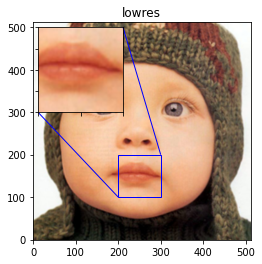

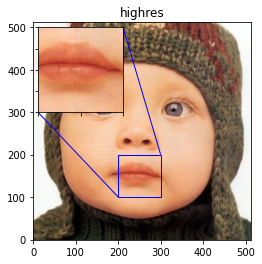

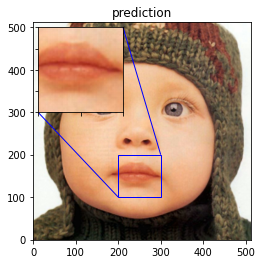

PSNR of low resolution image and high resolution image is 34.8720
PSNR of predict and high resolution is 35.7467


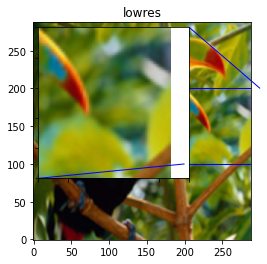

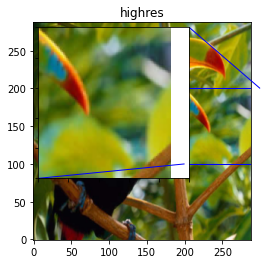

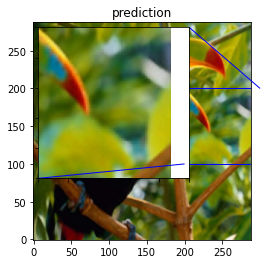

PSNR of low resolution image and high resolution image is 26.1165
PSNR of predict and high resolution is 29.4382


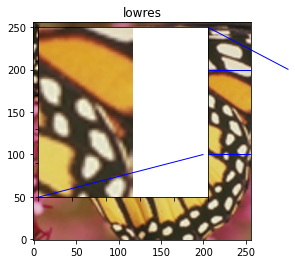

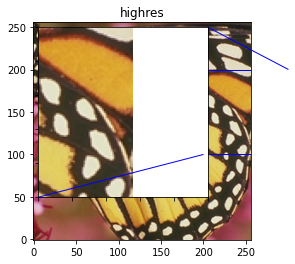

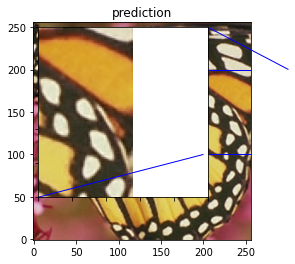

PSNR of low resolution image and high resolution image is 31.5091
PSNR of predict and high resolution is 31.5683


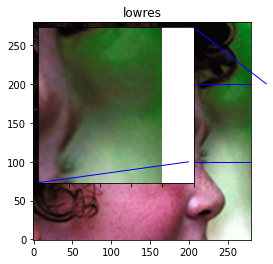

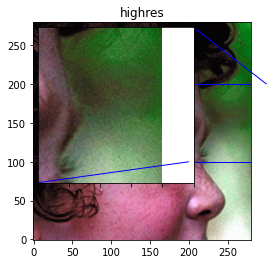

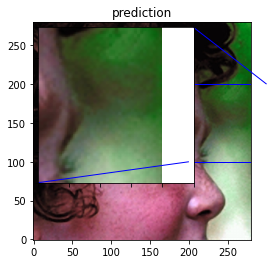

Avg. PSNR of lowres images is 25.6227
Avg. PSNR of reconstructions is 26.4322


In [31]:
total_bicubic_psnr = 0.0
total_test_psnr = 0.0

for index, test_img_path in enumerate(test_img_paths[0:4]):
    img = load_img(test_img_path)
    lowres_input = get_lowres_image(img, upscale_factor)
    w = lowres_input.size[0] * upscale_factor
    h = lowres_input.size[1] * upscale_factor
    highres_img = img.resize((w, h))
    prediction = upscale_image(model, lowres_input)
    lowres_img = lowres_input.resize((w, h))
    lowres_img_arr = img_to_array(lowres_img)
    highres_img_arr = img_to_array(highres_img)
    predict_img_arr = img_to_array(prediction)
    bicubic_psnr = tf.image.psnr(lowres_img_arr, highres_img_arr, max_val=255)
    test_psnr = tf.image.psnr(predict_img_arr, highres_img_arr, max_val=255)

    total_bicubic_psnr += bicubic_psnr
    total_test_psnr += test_psnr

    print(
        "PSNR of low resolution image and high resolution image is %.4f" % bicubic_psnr
    )
    print("PSNR of predict and high resolution is %.4f" % test_psnr)
    plot_results(lowres_img, index, "lowres")
    plot_results(highres_img, index, "highres")
    plot_results(prediction, index, "prediction")

print("Avg. PSNR of lowres images is %.4f" % (total_bicubic_psnr / 5))
print("Avg. PSNR of reconstructions is %.4f" % (total_test_psnr / 5))

In [ ]:
#EXTRA EXAMPLE

70770688/70763455 [==============================] - 4s 0us/step
Found 500 files belonging to 2 classes.
Using 400 files for training.
Found 500 files belonging to 2 classes.
Using 100 files for validation.


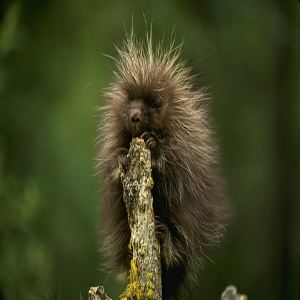

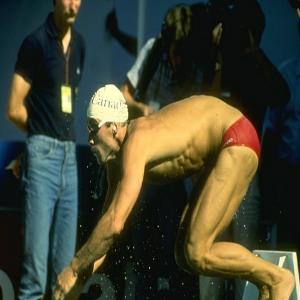

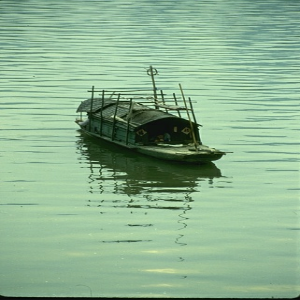

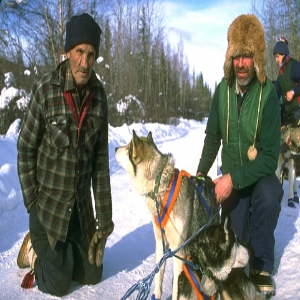

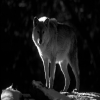

...

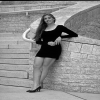

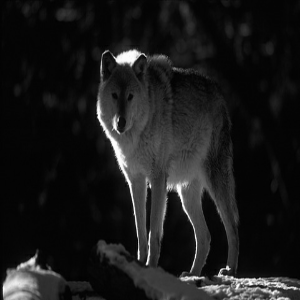

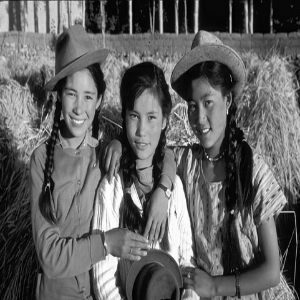

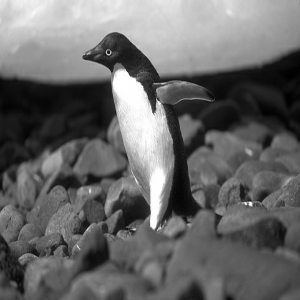

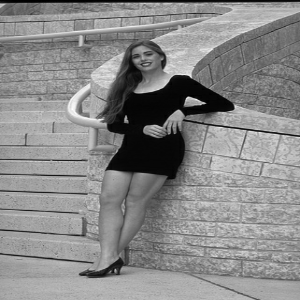

Model: "functional_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 100, 100, 1)]     0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 100, 100, 64)      1664      
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 100, 100, 64)      36928     
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 100, 100, 32)      18464     
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 100, 100, 9)       2601      
_________________________________________________________________
tf_op_layer_DepthToSpace_1 ( [(None, 300, 300, 1)]     0         
Total params: 59,657
Trainable params: 59,657
Non-trainable params: 0
__________________________________________________

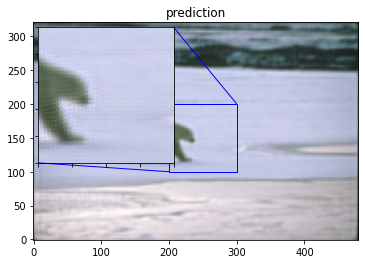

100/100 - 3s - loss: 0.0241 - val_loss: 0.0043
Epoch 2/50
Mean PSNR for epoch: 25.86


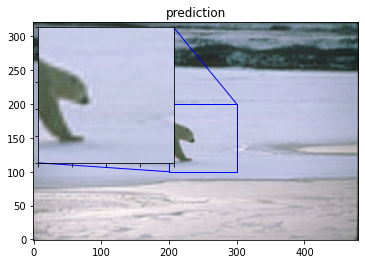

100/100 - 3s - loss: 0.0036 - val_loss: 0.0028
Epoch 3/50
Mean PSNR for epoch: 26.01


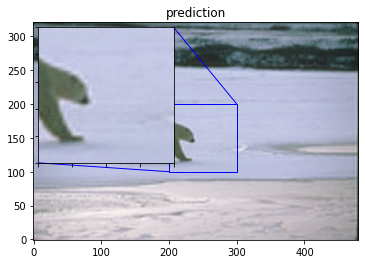

100/100 - 3s - loss: 0.0030 - val_loss: 0.0026
Epoch 4/50
Mean PSNR for epoch: 26.35


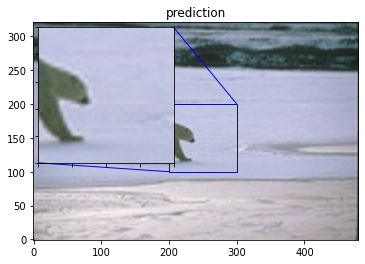

100/100 - 3s - loss: 0.0028 - val_loss: 0.0025
Epoch 5/50
Mean PSNR for epoch: 26.70


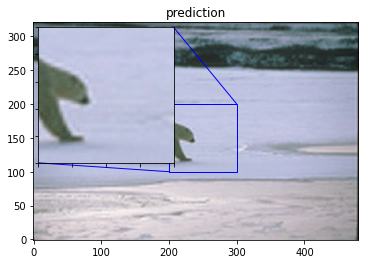

100/100 - 3s - loss: 0.0030 - val_loss: 0.0024
Epoch 6/50
Mean PSNR for epoch: 26.32


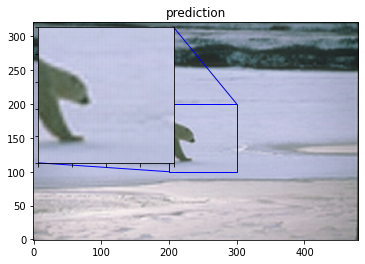

100/100 - 3s - loss: 0.0027 - val_loss: 0.0024
Epoch 7/50
Mean PSNR for epoch: 26.76


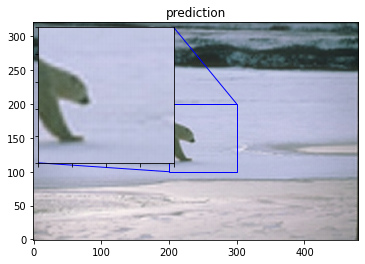

100/100 - 3s - loss: 0.0027 - val_loss: 0.0024
Epoch 8/50
Mean PSNR for epoch: 26.33


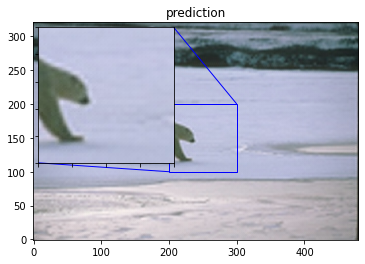

100/100 - 3s - loss: 0.0027 - val_loss: 0.0024
Epoch 9/50
Mean PSNR for epoch: 26.36


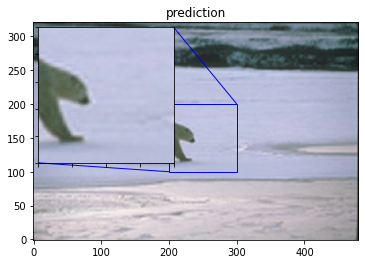

100/100 - 3s - loss: 0.0028 - val_loss: 0.0024
Epoch 10/50
Mean PSNR for epoch: 26.75


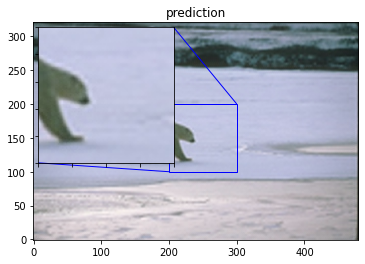

100/100 - 3s - loss: 0.0027 - val_loss: 0.0024
Epoch 11/50
Mean PSNR for epoch: 26.62


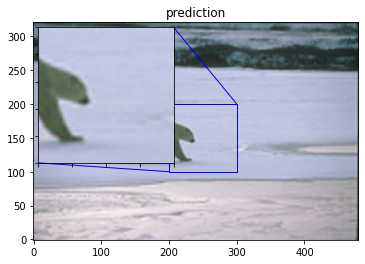

100/100 - 3s - loss: 0.0027 - val_loss: 0.0024
Epoch 12/50
Mean PSNR for epoch: 26.32


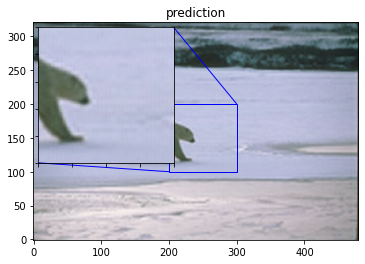

100/100 - 3s - loss: 0.0028 - val_loss: 0.0024
Epoch 13/50
Mean PSNR for epoch: 26.60


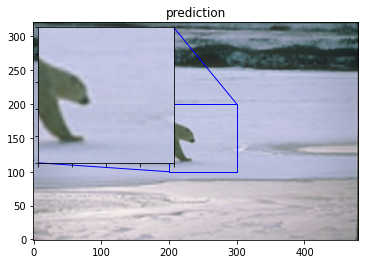

100/100 - 3s - loss: 0.0026 - val_loss: 0.0023
Epoch 14/50
Mean PSNR for epoch: 26.41


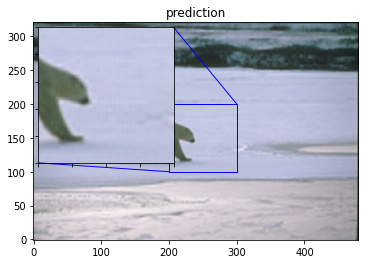

100/100 - 3s - loss: 0.0026 - val_loss: 0.0023
Epoch 15/50
Mean PSNR for epoch: 26.69


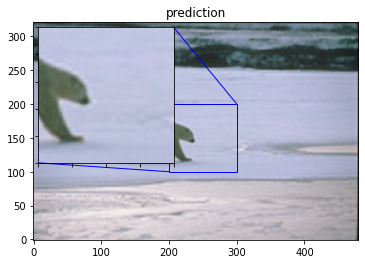

100/100 - 3s - loss: 0.0026 - val_loss: 0.0023
Epoch 16/50
Mean PSNR for epoch: 26.57


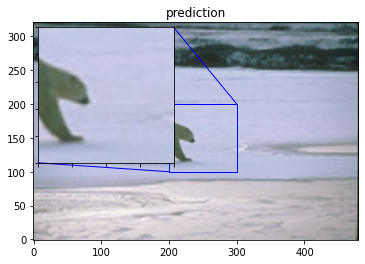

100/100 - 3s - loss: 0.0026 - val_loss: 0.0023
Epoch 17/50
Mean PSNR for epoch: 26.48


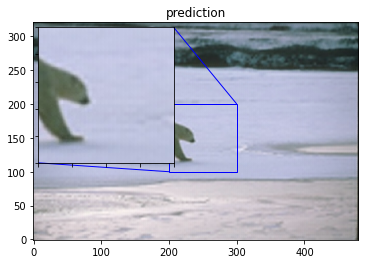

100/100 - 3s - loss: 0.0026 - val_loss: 0.0023
Epoch 18/50
Mean PSNR for epoch: 26.64


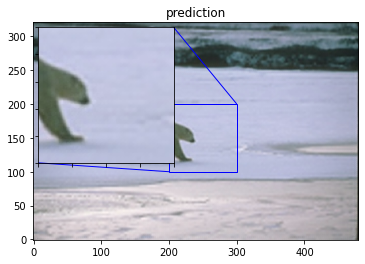

100/100 - 3s - loss: 0.0027 - val_loss: 0.0023
Epoch 19/50
Mean PSNR for epoch: 26.78


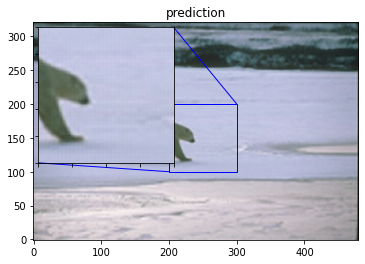

100/100 - 3s - loss: 0.0026 - val_loss: 0.0023
Epoch 20/50
Mean PSNR for epoch: 26.75


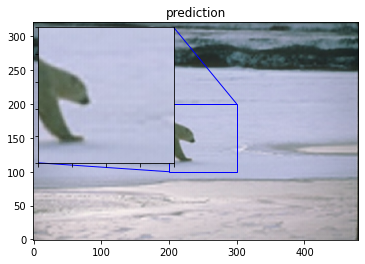

100/100 - 3s - loss: 0.0026 - val_loss: 0.0023
Epoch 21/50
Mean PSNR for epoch: 26.91


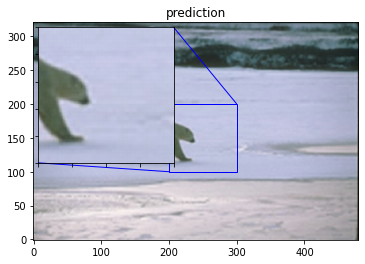

100/100 - 3s - loss: 0.0026 - val_loss: 0.0023
Epoch 22/50
Mean PSNR for epoch: 26.77


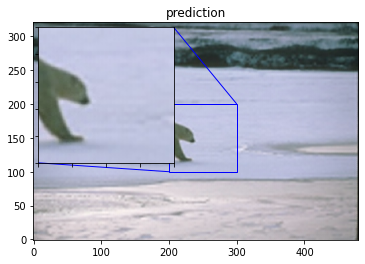

100/100 - 3s - loss: 0.0026 - val_loss: 0.0023
Epoch 23/50
Mean PSNR for epoch: 26.64


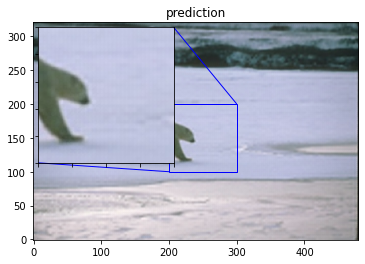

100/100 - 3s - loss: 0.0026 - val_loss: 0.0023
Epoch 24/50
Mean PSNR for epoch: 26.86


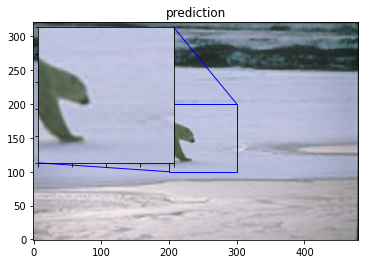

100/100 - 3s - loss: 0.0026 - val_loss: 0.0023
Epoch 25/50
Mean PSNR for epoch: 26.81


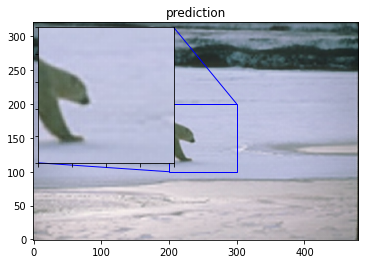

100/100 - 3s - loss: 0.0026 - val_loss: 0.0023
Epoch 26/50
Mean PSNR for epoch: 26.66


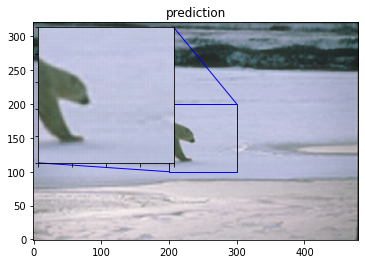

100/100 - 3s - loss: 0.0025 - val_loss: 0.0023
Epoch 27/50
Mean PSNR for epoch: 26.79


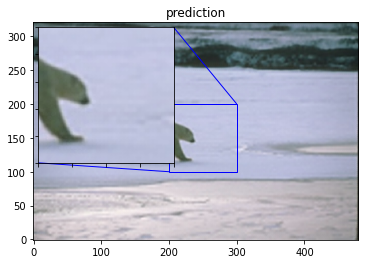

100/100 - 3s - loss: 0.0026 - val_loss: 0.0023
Epoch 28/50
Mean PSNR for epoch: 26.74


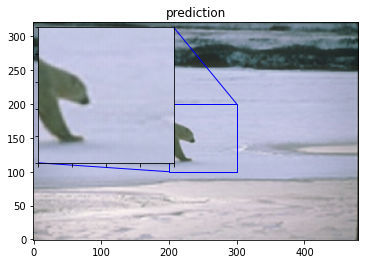

100/100 - 3s - loss: 0.0026 - val_loss: 0.0023
Epoch 29/50
Mean PSNR for epoch: 26.59


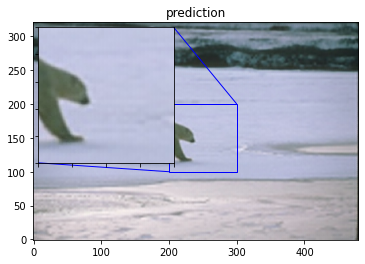

100/100 - 3s - loss: 0.0025 - val_loss: 0.0023
Epoch 30/50
Mean PSNR for epoch: 26.56


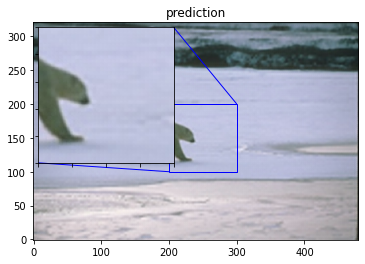

100/100 - 3s - loss: 0.0025 - val_loss: 0.0023
Epoch 31/50
Mean PSNR for epoch: 26.41


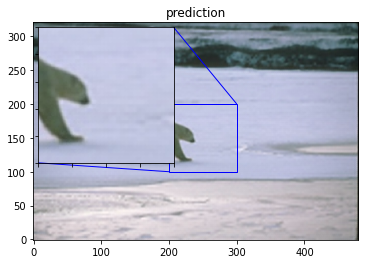

100/100 - 3s - loss: 0.0026 - val_loss: 0.0023
Epoch 32/50
Mean PSNR for epoch: 26.64


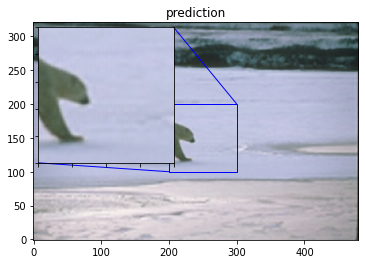

100/100 - 3s - loss: 0.0025 - val_loss: 0.0023
Epoch 33/50
Mean PSNR for epoch: 26.75


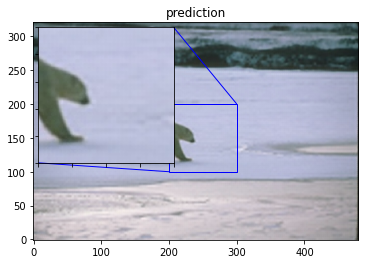

100/100 - 3s - loss: 0.0025 - val_loss: 0.0023
Epoch 34/50
Mean PSNR for epoch: 26.84


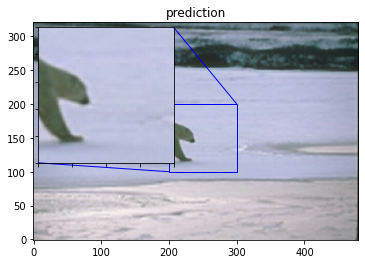

100/100 - 3s - loss: 0.0025 - val_loss: 0.0022
Epoch 35/50
Mean PSNR for epoch: 26.75


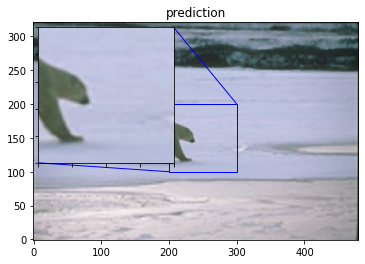

100/100 - 3s - loss: 0.0026 - val_loss: 0.0022
Epoch 36/50
Mean PSNR for epoch: 26.79


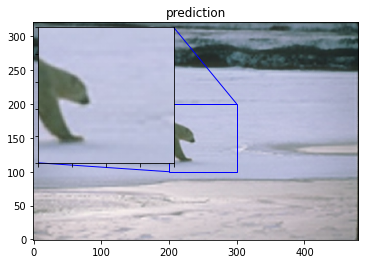

100/100 - 3s - loss: 0.0025 - val_loss: 0.0023
Epoch 37/50
Mean PSNR for epoch: 26.66


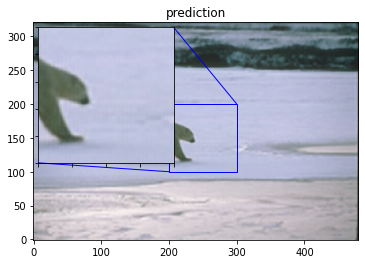

100/100 - 3s - loss: 0.0026 - val_loss: 0.0023
Epoch 38/50
Mean PSNR for epoch: 26.68


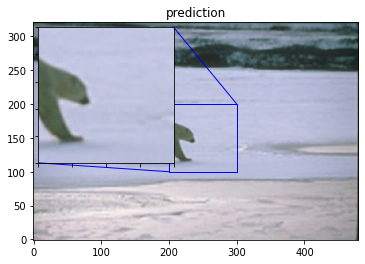

100/100 - 3s - loss: 0.0025 - val_loss: 0.0022
Epoch 39/50
Mean PSNR for epoch: 26.62


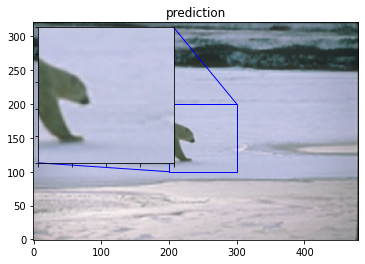

100/100 - 3s - loss: 0.0025 - val_loss: 0.0022
Epoch 40/50
Mean PSNR for epoch: 26.75


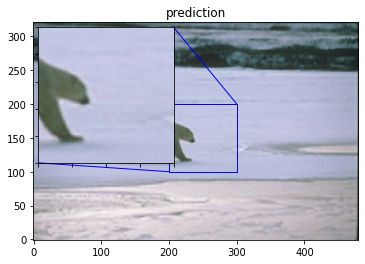

100/100 - 3s - loss: 0.0026 - val_loss: 0.0022
Epoch 41/50
Mean PSNR for epoch: 26.99


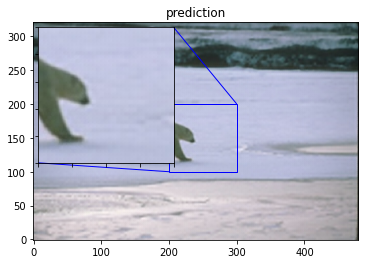

100/100 - 3s - loss: 0.0025 - val_loss: 0.0022
Epoch 42/50
Mean PSNR for epoch: 26.91


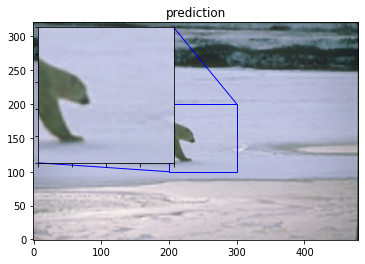

100/100 - 3s - loss: 0.0025 - val_loss: 0.0022
Epoch 43/50
Mean PSNR for epoch: 26.85


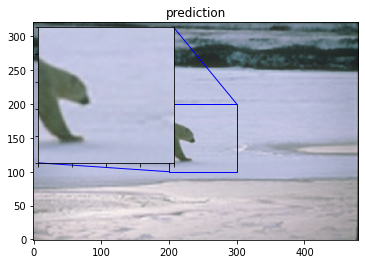

100/100 - 3s - loss: 0.0025 - val_loss: 0.0022
Epoch 44/50
Mean PSNR for epoch: 26.90


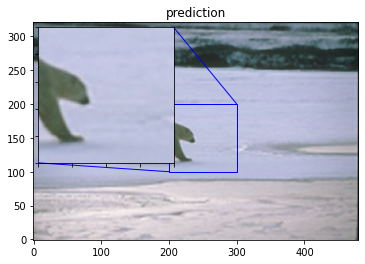

100/100 - 3s - loss: 0.0025 - val_loss: 0.0022
Epoch 45/50
Mean PSNR for epoch: 26.65


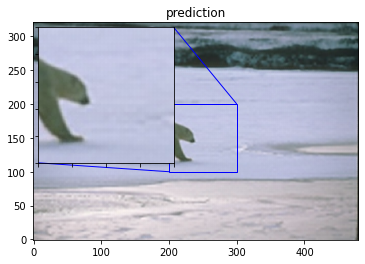

100/100 - 3s - loss: 0.0026 - val_loss: 0.0022
Epoch 46/50
Mean PSNR for epoch: 26.67


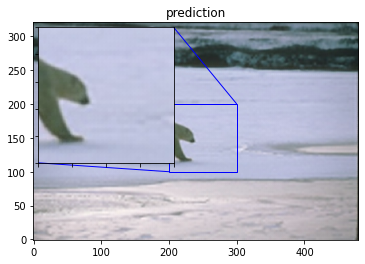

100/100 - 3s - loss: 0.0025 - val_loss: 0.0022
Epoch 47/50
Mean PSNR for epoch: 26.64


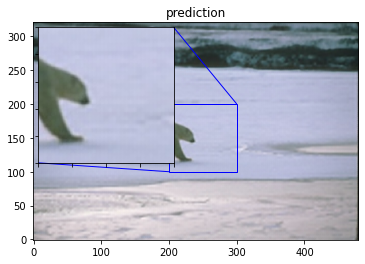

100/100 - 3s - loss: 0.0025 - val_loss: 0.0022
Epoch 48/50
Mean PSNR for epoch: 26.62


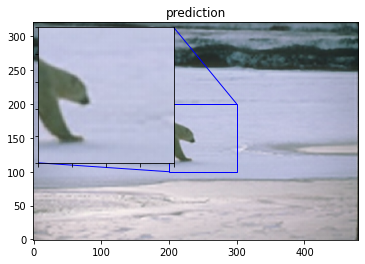

100/100 - 3s - loss: 0.0025 - val_loss: 0.0022
Epoch 49/50
Mean PSNR for epoch: 26.80


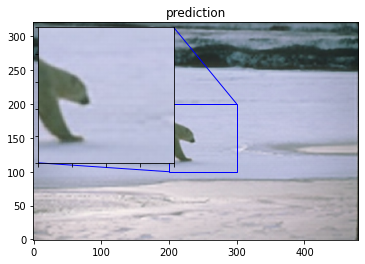

100/100 - 3s - loss: 0.0025 - val_loss: 0.0022
Epoch 50/50
Mean PSNR for epoch: 26.56


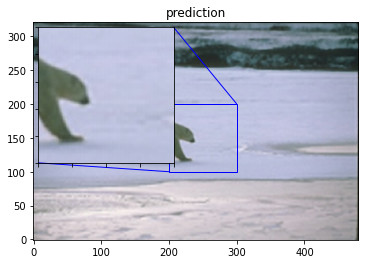

100/100 - 3s - loss: 0.0025 - val_loss: 0.0022
PSNR of low resolution image and high resolution image is 29.8502
PSNR of predict and high resolution is 30.3069


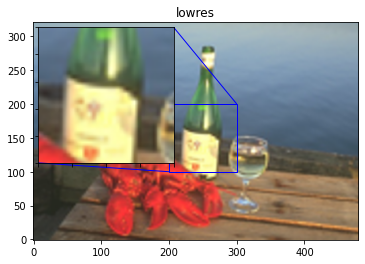

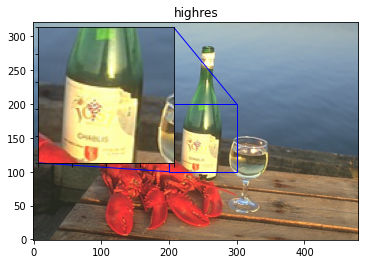

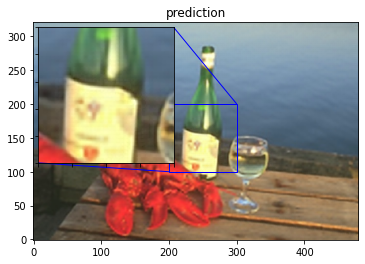

PSNR of low resolution image and high resolution image is 24.9783
PSNR of predict and high resolution is 25.9039


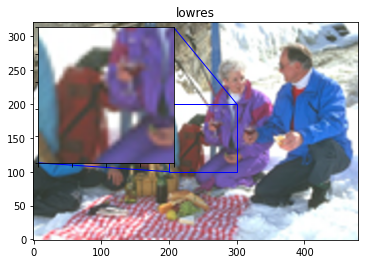

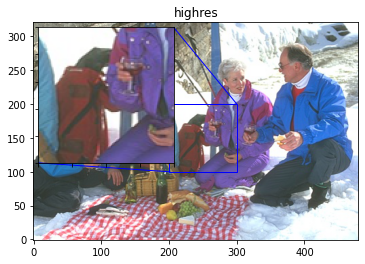

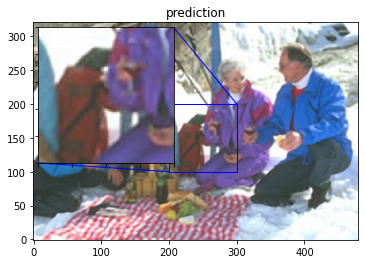

PSNR of low resolution image and high resolution image is 27.7724
PSNR of predict and high resolution is 28.3602


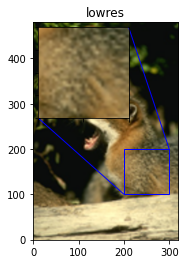

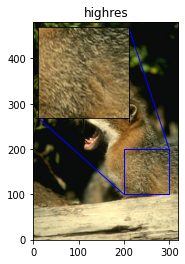

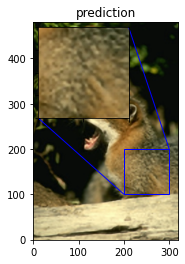

PSNR of low resolution image and high resolution image is 28.0314
PSNR of predict and high resolution is 28.2448


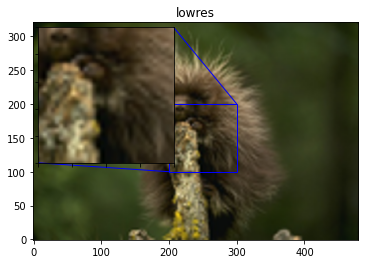

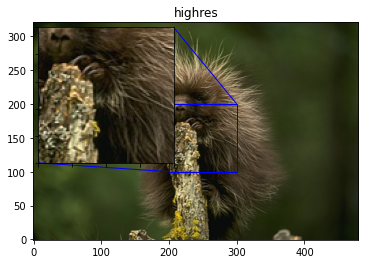

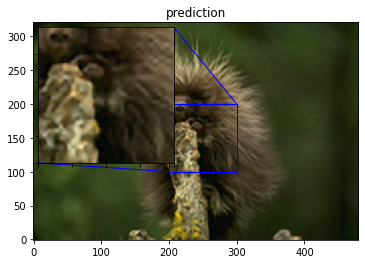

PSNR of low resolution image and high resolution image is 25.7630
PSNR of predict and high resolution is 26.3123


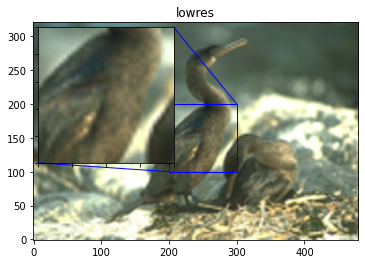

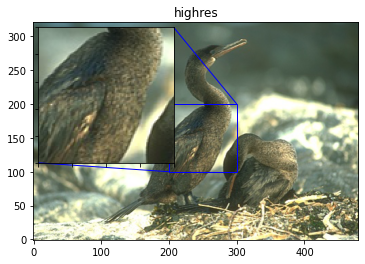

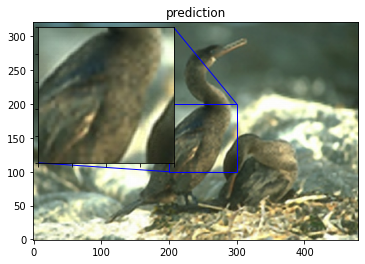

PSNR of low resolution image and high resolution image is 25.7874
PSNR of predict and high resolution is 26.5185


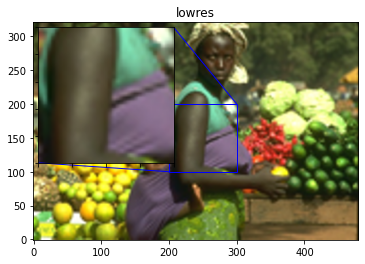

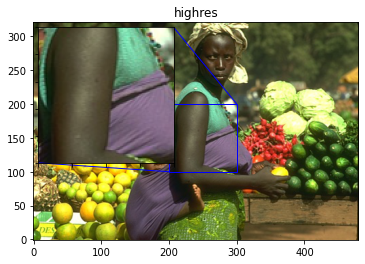

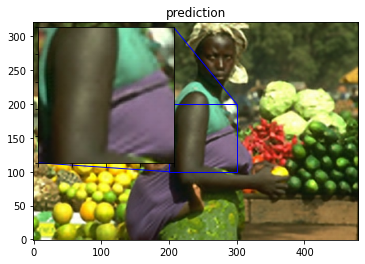

PSNR of low resolution image and high resolution image is 26.2512
PSNR of predict and high resolution is 27.1296


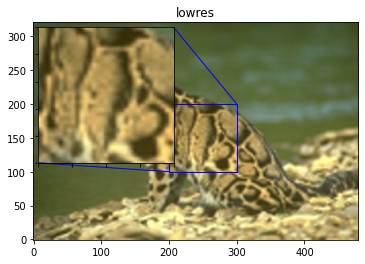

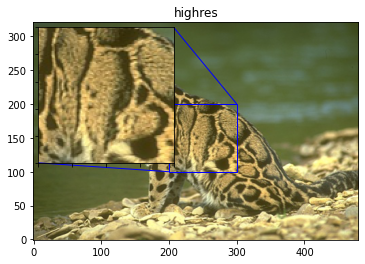

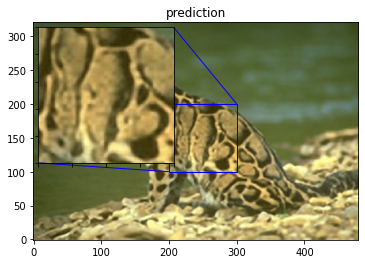

PSNR of low resolution image and high resolution image is 23.3820
PSNR of predict and high resolution is 24.6633


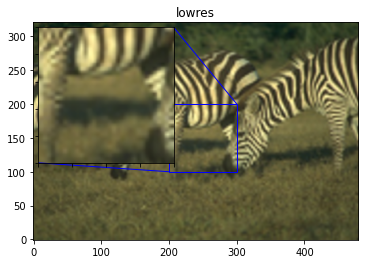

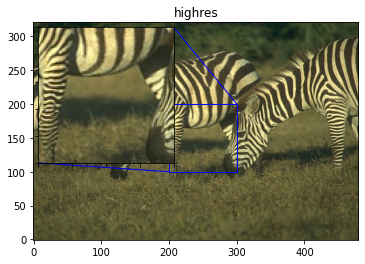

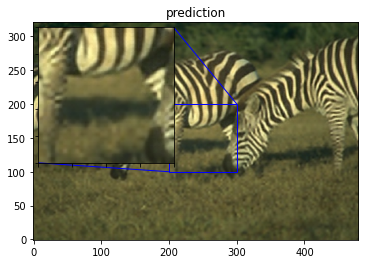

PSNR of low resolution image and high resolution image is 29.8914
PSNR of predict and high resolution is 30.0374


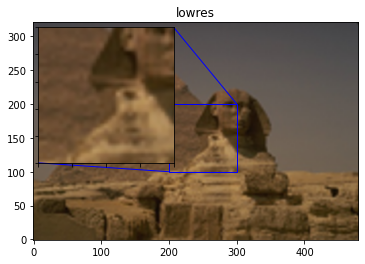

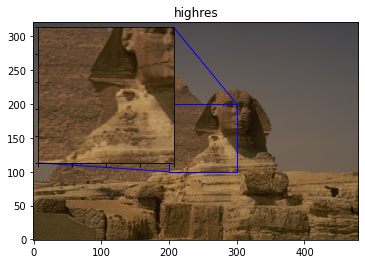

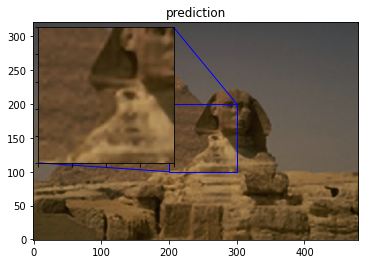

PSNR of low resolution image and high resolution image is 25.1712
PSNR of predict and high resolution is 25.6737


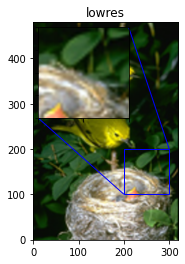

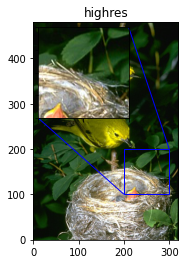

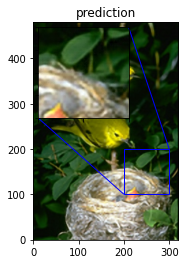

Avg. PSNR of lowres images is 26.6879
Avg. PSNR of reconstructions is 27.3151


In [32]:
import os
import math
import numpy as np

from tensorflow import keras
from tensorflow.keras import layers
from keras.preprocessing.image import load_img
from keras.preprocessing.image import array_to_img
from keras.preprocessing.image import img_to_array
from keras.preprocessing import image_dataset_from_directory

from IPython.display import display

"""
## Load data: BSDS500 dataset
### Download dataset
We use the built-in `keras.utils.get_file` utility to retrieve the dataset.
"""

dataset_url = "http://www.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz"
data_dir = keras.utils.get_file(origin=dataset_url, fname="BSR", untar=True)
root_dir = os.path.join(data_dir, "BSDS500/data")

"""
We create training and validation datasets via `image_dataset_from_directory`.
"""

crop_size = 300
upscale_factor = 3
batch_size = 4

train_ds = image_dataset_from_directory(
    root_dir,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="training",
    seed=1337,
    label_mode=None,
)

valid_ds = image_dataset_from_directory(
    root_dir,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="validation",
    seed=1337,
    label_mode=None,
)

"""
We rescale the images to take values in the range [0, 1].
"""


def scaling(input_image):
    input_image = input_image / 255.0
    return input_image


# Scale from (0, 255) to (0, 1)
train_ds = train_ds.map(scaling)
valid_ds = valid_ds.map(scaling)

"""
Let's visualize a few sample images:
"""

for batch in train_ds.take(1):
    for img in batch:
        display(array_to_img(img))

"""
We prepare a dataset of test image paths that we will use for
visual evaluation at the end of this example.
"""

dataset = os.path.join(root_dir, "images")
test_path = os.path.join(dataset, "test")

test_img_paths = sorted(
    [
        os.path.join(test_path, fname)
        for fname in os.listdir(test_path)
        if fname.endswith(".jpg")
    ]
)

"""
## Crop and resize images
Let's process image data.
First, we convert our images from the RGB color space to the
[YUV colour space](https://en.wikipedia.org/wiki/YUV).
For the input data (low-resolution images),
we crop the image, retrieve the `y` channel (luninance),
and resize it with the `area` method (use `BICUBIC` if you use PIL).
We only consider the luminance channel
in the YUV color space because humans are more sensitive to
luminance change.
For the target data (high-resolution images), we just crop the image
and retrieve the `y` channel.
"""


# Use TF Ops to process.
def process_input(input, crop_size, upscale_factor):
    input = tf.image.rgb_to_yuv(input)
    last_dimension_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis=last_dimension_axis)
    crop_size = crop_size // upscale_factor
    return tf.image.resize(y, [crop_size, crop_size], method="area")


def process_target(input):
    input = tf.image.rgb_to_yuv(input)
    last_dimension_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis=last_dimension_axis)
    return y


train_ds = train_ds.map(
    lambda x: (process_input(x, crop_size, upscale_factor), process_target(x))
)

valid_ds = valid_ds.map(
    lambda x: (process_input(x, crop_size, upscale_factor), process_target(x))
)

"""
Let's take a look at the input and target data.
"""

for batch in train_ds.take(1):
    for img in batch[0]:
        display(array_to_img(img))
    for img in batch[1]:
        display(array_to_img(img))

"""
## Build a model
Compared to the paper, we add one more layer and we use the `relu` activation function
instead of `tanh`.
It achieves better performance even though we train the model for fewer epochs.
"""

input_img_size = (crop_size // upscale_factor, crop_size // upscale_factor)
target_img_size = (crop_size, crop_size)
channels = 1


def get_model(upscale_factor=3, channels=1):
    conv_args = {
        "activation": "relu",
        "kernel_initializer": "Orthogonal",
        "padding": "same",
    }
    inputs = keras.Input(shape=input_img_size + (channels,))
    x = layers.Conv2D(64, 5, **conv_args)(inputs)
    x = layers.Conv2D(64, 3, **conv_args)(x)
    x = layers.Conv2D(32, 3, **conv_args)(x)
    x = layers.Conv2D(channels * (upscale_factor ** 2), 3, **conv_args)(x)
    outputs = tf.nn.depth_to_space(x, upscale_factor)

    return keras.Model(inputs, outputs)


"""
## Define utility functions
We need to define several utility functions to monitor our results:
- `plot_results` to plot an save an image.
- `get_lowres_image` to convert an image to its low-resolution version.
- `upscale_image` to turn a low-resolution image to
a high-resolution version reconstructed by the model.
In this function, we use the `y` channel from the YUV color space
as input to the model and then combine the output with the
other channels to obtain an RGB image.
"""

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import PIL


def plot_results(img, prefix, title):
    """Plot the result with zoom-in area."""
    img_array = img_to_array(img)
    img_array = img_array.astype("float32") / 255.0

    # Create a new figure with a default 111 subplot.
    fig, ax = plt.subplots()
    im = ax.imshow(img_array[::-1], origin="lower")

    plt.title(title)
    # zoom-factor: 2.0, location: upper-left
    axins = zoomed_inset_axes(ax, 2, loc=2)
    axins.imshow(img_array[::-1], origin="lower")

    # Specify the limits.
    x1, x2, y1, y2 = 200, 300, 100, 200
    # Apply the x-limits.
    axins.set_xlim(x1, x2)
    # Apply the y-limits.
    axins.set_ylim(y1, y2)

    plt.yticks(visible=False)
    plt.xticks(visible=False)

    # Make the line.
    mark_inset(ax, axins, loc1=1, loc2=3, fc="none", ec="blue")
    plt.savefig(str(prefix) + "-" + title + ".png")
    plt.show()


def get_lowres_image(img, upscale_factor):
    """Return low-resolution image and will use it as input."""
    lowres_img = img.resize(
        (img.size[0] // upscale_factor, img.size[1] // upscale_factor),
        PIL.Image.BICUBIC,
    )
    return lowres_img


def upscale_image(model, img):
    """Predict the result based on input image and restore the image as RGB."""
    ycbcr = img.convert("YCbCr")
    y, cb, cr = ycbcr.split()
    y = img_to_array(y)
    y = y.astype("float32") / 255.0

    input = np.expand_dims(y, axis=0)
    out = model.predict(input)

    out_img_y = out[0]
    out_img_y *= 255.0

    # Restore the image in RGB color space.
    out_img_y = out_img_y.clip(0, 255)
    out_img_y = out_img_y.reshape((np.shape(out_img_y)[0], np.shape(out_img_y)[1]))
    out_img_y = PIL.Image.fromarray(np.uint8(out_img_y), mode="L")
    out_img_cb = cb.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img_cr = cr.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img = PIL.Image.merge("YCbCr", (out_img_y, out_img_cb, out_img_cr)).convert(
        "RGB"
    )
    return out_img


"""
## Define callbacks to monitor training
The `ESPCNCallback` object will compute and display
the [PSNR](https://en.wikipedia.org/wiki/Peak_signal-to-noise_ratio) metric.
This is the main metric we use to evaluate super-resolution performance.
"""


class ESPCNCallback(keras.callbacks.Callback):
    def __init__(self):
        super(ESPCNCallback, self).__init__()
        self.test_img = get_lowres_image(load_img(test_img_paths[0]), upscale_factor)

    # Store PSNR value in each epoch.
    def on_epoch_begin(self, epoch, logs=None):
        self.psnr = []

    def on_epoch_end(self, epoch, logs=None):
        print("Mean PSNR for epoch: %.2f" % (np.mean(self.psnr)))
        prediction = upscale_image(self.model, self.test_img)
        plot_results(prediction, "epoch-" + str(epoch), "prediction")

    def on_test_batch_end(self, batch, logs=None):
        self.psnr.append(10 * math.log10(1 / logs["loss"]))


"""
Define `ModelCheckpoint` and `EarlyStopping` callbacks.
"""

early_stopping_callback = keras.callbacks.EarlyStopping(monitor="loss", patience=10)

checkpoint_filepath = "/tmp/checkpoint"

model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor="loss",
    mode="min",
    save_best_only=True,
)

model = get_model(upscale_factor=upscale_factor, channels=channels)
model.summary()

callbacks = [ESPCNCallback(), early_stopping_callback, model_checkpoint_callback]
loss_fn = keras.losses.MeanSquaredError()
optimizer = keras.optimizers.Adam(learning_rate=0.001)

"""
## Train the model
"""

epochs = 50

model.compile(
    optimizer=optimizer, loss=loss_fn,
)

model.fit(
    train_ds, epochs=epochs, callbacks=callbacks, validation_data=valid_ds, verbose=2
)

# The model weights (that are considered the best) are loaded into the model.
model.load_weights(checkpoint_filepath)

"""
## Run model prediction and plot the results
Let's compute the reconstructed version of a few images and save the results.
"""

total_bicubic_psnr = 0.0
total_test_psnr = 0.0

for index, test_img_path in enumerate(test_img_paths[50:60]):
    img = load_img(test_img_path)
    lowres_input = get_lowres_image(img, upscale_factor)
    w = lowres_input.size[0] * upscale_factor
    h = lowres_input.size[1] * upscale_factor
    highres_img = img.resize((w, h))
    prediction = upscale_image(model, lowres_input)
    lowres_img = lowres_input.resize((w, h))
    lowres_img_arr = img_to_array(lowres_img)
    highres_img_arr = img_to_array(highres_img)
    predict_img_arr = img_to_array(prediction)
    bicubic_psnr = tf.image.psnr(lowres_img_arr, highres_img_arr, max_val=255)
    test_psnr = tf.image.psnr(predict_img_arr, highres_img_arr, max_val=255)

    total_bicubic_psnr += bicubic_psnr
    total_test_psnr += test_psnr

    print(
        "PSNR of low resolution image and high resolution image is %.4f" % bicubic_psnr
    )
    print("PSNR of predict and high resolution is %.4f" % test_psnr)
    plot_results(lowres_img, index, "lowres")
    plot_results(highres_img, index, "highres")
    plot_results(prediction, index, "prediction")

print("Avg. PSNR of lowres images is %.4f" % (total_bicubic_psnr / 10))
print("Avg. PSNR of reconstructions is %.4f" % (total_test_psnr / 10))